In [127]:
!pip install -U kaleido
!pip install pillow

In [129]:
%autosave 5
import pandas as pd
import numpy as np
import math
import statistics
import matplotlib.pyplot as plt
import kaleido.scopes.plotly as kaleido
import IPython.display as display
import plotly.io as pio
import matplotlib.mlab as mlab
import matplotlib
import seaborn as sns
plt.style.use('ggplot')
from matplotlib.pyplot import figure
import plotly.graph_objects as go
import plotly.express as px
import geopandas as geo
from datetime import datetime, timedelta

Autosaving every 5 seconds


-----------------------------------------------------

## 2. Initial Data Load

In [74]:
crime = pd.read_csv('/Users/kofile/Documents/Code/Projects/AustinCrime/final_export/final_export_v2.csv')
house = pd.read_csv('/Users/kofile/Documents/Code/Projects/AustinCrime/final_export/2014housing_final.csv')

------------------------------------------------------

## 3. Data Inspection

#### 3a. Check first 5 rows and data types for both datasets

In [63]:
len(crime)

2175275

In [64]:
crime.head()

,F1,OffenseDescription,OffenseCode,FV_Flag,OccurredDate,OccurredTime,ReportDate,ReportTime,LocType,Address,Zip,CensusTract,Latitude,Longitude,Location
0,941036,THEFT,600,N,12/19/2018,1833.0,12/19/2018,1833.0,NaN,2901 S CAPITAL OF TX HWY,NaN,NaN,30.257886,-97.807007,"(30.25788603, -97.80700704)"
1,976078,THEFT,600,N,4/5/2018,1910.0,4/5/2018,1910.0,NaN,13201 N FM 620,NaN,NaN,30.467936,-97.792507,"(30.46793555, -97.79250733)"
2,889630,POSS CONTROLLED SUB/NARCOTIC,1800,N,7/17/2005,415.0,7/17/2005,415.0,NaN,9300 NORTH DRIVE,NaN,NaN,30.360320,-97.692527,"(30.36031988, -97.6925269)"
3,885608,POSS CONTROLLED SUB/NARCOTIC,1800,N,9/27/2005,1608.0,9/27/2005,1608.0,NaN,1709 E BASTROP HIGHWAY,NaN,NaN,30.215862,-97.748852,"(30.21586176, -97.74885238)"
4,907122,POSS CONTROLLED SUB/NARCOTIC,1800,N,10/27/2005,1625.0,10/27/2005,1625.0,NaN,1603 WATERFALL AVE,NaN,NaN,30.539738,-97.653994,"(30.53973836, -97.65399353)"


In [66]:
crime.dtypes

F1                      int64
OffenseDescription     object
OffenseCode             int64
FV_Flag                object
OccurredDate           object
OccurredTime          float64
ReportDate             object
ReportTime            float64
LocType                object
Address                object
Zip                   float64
CensusTract           float64
Latitude              float64
Longitude             float64
Location               object
dtype: object

In [67]:
len(house)

36

In [68]:
house.head()

,zip_house,below_pov,mhhi,nwperc,hperc,disperc,ueperc,lghhperc,aff_home_perc,aff_rent_perc,...,aou_artis,aru_teacher,aou_teacher,aru_tech,aou_tech,pov_delta,med_rent_delta,median_hv_delta,tx_prox,mean_transpo_cost
0,78739,1%,126525,0.14,0.15,0.04,0.04,0.13,0.00,0.00,...,0.00,0.08,0.00,0.71,0.11,0.46,0.00,0.72,0.08,786
1,78717,3%,93305,0.25,0.14,0.04,0.05,0.09,0.07,0.01,...,0.00,0.70,0.06,0.98,0.67,6.38,0.02,0.33,0.03,708
2,78732,3%,127726,0.13,0.09,0.03,0.05,0.15,0.00,0.00,...,0.00,0.26,0.00,0.80,0.15,12.42,1.05,0.75,0.00,786
3,78730,4%,119573,0.13,0.05,0.04,0.03,0.09,0.19,0.00,...,0.01,0.64,0.17,0.99,0.25,2.83,0.22,0.44,0.02,786
4,78746,5%,125327,0.10,0.08,0.06,0.04,0.07,0.01,0.04,...,0.00,0.48,0.01,0.94,0.06,0.32,0.32,0.80,0.14,786


In [69]:
house.dtypes

zip_house              int64
below_pov             object
mhhi                   int64
nwperc               float64
hperc                float64
disperc              float64
ueperc               float64
lghhperc             float64
aff_home_perc        float64
aff_rent_perc        float64
rru_perc             float64
medianrent             int64
medianhomevalue        int64
housing_delta        float64
aru_artis            float64
aou_artis            float64
aru_teacher          float64
aou_teacher          float64
aru_tech             float64
aou_tech             float64
pov_delta            float64
med_rent_delta       float64
median_hv_delta      float64
tx_prox              float64
mean_transpo_cost      int64
dtype: object

#### 3b. Check for Duplicates in both datasets

In [70]:
# Crime Duplicates

# Low number of duplicates overall, and the values that are duplicated are Times, Addresses, and Zip Codes = Things that are reasonable to be duplicated and the same given the dataset(s)


for col in crime.columns:
    pct_missing = np.mean(crime[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

F1 - 0.0%
OffenseDescription - 0.0%
OffenseCode - 0.0%
FV_Flag - 0.0%
OccurredDate - 0.0%
OccurredTime - 3.861580719679121e-05%
ReportDate - 0.0%
ReportTime - 4.597119904379906e-07%
LocType - 0.009525232441875165%
Address - 5.516543885255887e-06%
Zip - 0.006327016124398064%
CensusTract - 0.0059509717162197886%
Latitude - 0.01701394076611003%
Longitude - 0.01701394076611003%
Location - 0.01701394076611003%


In [71]:
# House Duplicates

# Virtually no duplicates. Percentages and Rent values are duplicated which is acceptable given the dataset.

for col in house.columns:
    pct_missing = np.mean(house[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

zip_house - 0.0%
below_pov - 0.0%
mhhi - 0.0%
nwperc - 0.0%
hperc - 0.0%
disperc - 0.0%
ueperc - 0.0%
lghhperc - 0.0%
aff_home_perc - 0.027777777777777776%
aff_rent_perc - 0.0%
rru_perc - 0.0%
medianrent - 0.0%
medianhomevalue - 0.0%
housing_delta - 0.0%
aru_artis - 0.0%
aou_artis - 0.027777777777777776%
aru_teacher - 0.0%
aou_teacher - 0.027777777777777776%
aru_tech - 0.0%
aou_tech - 0.027777777777777776%
pov_delta - 0.0%
med_rent_delta - 0.0%
median_hv_delta - 0.0%
tx_prox - 0.0%
mean_transpo_cost - 0.0%


---------------------------------------

## 4. Merged Dataset

#### Need to merge the two datasets on a similar key. After joining, I will do data wrangling and a more thorough inspection.

In [76]:
crime['zip']=crime['Zip']
house['zip']=house['zip_house']

In [77]:
merged=crime.merge(house, on='zip', how='left')

### 4b. Merged Data Inspection

In [78]:
len(merged)

2175275

In [79]:
merged.head()

,F1,OffenseDescription,OffenseCode,FV_Flag,OccurredDate,OccurredTime,ReportDate,ReportTime,LocType,Address,...,aou_artis,aru_teacher,aou_teacher,aru_tech,aou_tech,pov_delta,med_rent_delta,median_hv_delta,tx_prox,mean_transpo_cost
0,941036,THEFT,600,N,12/19/2018,1833.0,12/19/2018,1833.0,NaN,2901 S CAPITAL OF TX HWY,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,976078,THEFT,600,N,4/5/2018,1910.0,4/5/2018,1910.0,NaN,13201 N FM 620,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,889630,POSS CONTROLLED SUB/NARCOTIC,1800,N,7/17/2005,415.0,7/17/2005,415.0,NaN,9300 NORTH DRIVE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,885608,POSS CONTROLLED SUB/NARCOTIC,1800,N,9/27/2005,1608.0,9/27/2005,1608.0,NaN,1709 E BASTROP HIGHWAY,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,907122,POSS CONTROLLED SUB/NARCOTIC,1800,N,10/27/2005,1625.0,10/27/2005,1625.0,NaN,1603 WATERFALL AVE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
merged.dtypes

F1                      int64
OffenseDescription     object
OffenseCode             int64
FV_Flag                object
OccurredDate           object
OccurredTime          float64
ReportDate             object
ReportTime            float64
LocType                object
Address                object
Zip                   float64
CensusTract           float64
Latitude              float64
Longitude             float64
Location               object
zip                   float64
zip_house             float64
below_pov              object
mhhi                  float64
nwperc                float64
hperc                 float64
disperc               float64
ueperc                float64
lghhperc              float64
aff_home_perc         float64
aff_rent_perc         float64
rru_perc              float64
medianrent            float64
medianhomevalue       float64
housing_delta         float64
aru_artis             float64
aou_artis             float64
aru_teacher           float64
aou_teache

In [81]:
# Checking number of unique columns --> Checking for duplicates. Specifically, the "zip" columns from each source dataset

merged.columns.nunique()

41

In [82]:
# % Missing Data by Column
for col in merged.columns:
    pct_missing = np.mean(merged[col].isnull())
    print('{} - {}%'.format(col, pct_missing))


# Extremely low null percentages, similar to what we were seeing when the datasets were separate.

F1 - 0.0%
OffenseDescription - 0.0%
OffenseCode - 0.0%
FV_Flag - 0.0%
OccurredDate - 0.0%
OccurredTime - 3.861580719679121e-05%
ReportDate - 0.0%
ReportTime - 4.597119904379906e-07%
LocType - 0.009525232441875165%
Address - 5.516543885255887e-06%
Zip - 0.006327016124398064%
CensusTract - 0.0059509717162197886%
Latitude - 0.01701394076611003%
Longitude - 0.01701394076611003%
Location - 0.01701394076611003%
zip - 0.006327016124398064%
zip_house - 0.029074025123260277%
below_pov - 0.029074025123260277%
mhhi - 0.029074025123260277%
nwperc - 0.029074025123260277%
hperc - 0.029074025123260277%
disperc - 0.029074025123260277%
ueperc - 0.029074025123260277%
lghhperc - 0.029074025123260277%
aff_home_perc - 0.03649285722494857%
aff_rent_perc - 0.029074025123260277%
rru_perc - 0.029074025123260277%
medianrent - 0.029074025123260277%
medianhomevalue - 0.029074025123260277%
housing_delta - 0.029074025123260277%
aru_artis - 0.029074025123260277%
aou_artis - 0.03649285722494857%
aru_teacher - 0.02907

---------------------------

## 5. Data Wrangling

### 5a. Changing/Editing Column Names

In [84]:
# Converting "zip" Zip Code column to a string. Even though it is a number, it is a qualitative value and if it is left as a float, it will change viualizations to where they aren't easily readible


merged['zip'] = merged['zip'].astype(str)

In [85]:
# Renaming and Editing Column Names

# Rename "OccurredDate" to "occdate"
merged=merged.rename(columns={'OccurredDate':"occdate"})

# Convert OccurredDate to DateTime 
merged['occddate']= pd.to_datetime(merged['occdate'])

# Create New "Year" column based on OccurredDate
merged['year']= pd.to_datetime(merged['occdate']).dt.year

# Create new "Month" column based on OccurredDate
merged['month']= pd.to_datetime(merged['occdate']).dt.month

# Rename "FV_Flag" as "fvflag"
merged=merged.rename(columns={'FV_Flag':'fvflag'})

# Rename "OffenseDescription" to "offdec"
merged=merged.rename(columns={'OffenseDescription':"offdec"})

# Rename "OffenseCode" to "offdec"
merged=merged.rename(columns={'OffenseCode':"offcode"})

# Rename LocType to loctype
merged=merged.rename(columns={'LocType':"loctype"})

# Rename Address to address
merged['Address'] = merged['Address'].str.lower()

# Rename Offense Code to offcode
merged=merged.rename(columns={'OffenseCode':"offcode"})


# Rename ReportDate to rdate
merged=merged.rename(columns={'ReportDate':"rdate"})


# Rename ReportTime to rtime
merged=merged.rename(columns={'ReportTime':"rtime"})


# Rename Address to address
merged=merged.rename(columns={'Address':"address"})


# Latitude --> lat
merged=merged.rename(columns={'Latitude':"lat"})

# Longitude --> long
merged=merged.rename(columns={'Longitude':"long"})

# Location --> loc
merged=merged.rename(columns={'Location':"loc"})

# CensusTract --> ctract
merged=merged.rename(columns={'CensusTract':"ctract"})

# Occurred Time --> occtime
merged=merged.rename(columns={'OccurredTime':"occtime"})

### 5b. Filter for 2014 Data

In [86]:
# Distinct Years within Dataset

merged['year'].unique()

array([2018, 2005, 2017, 2008, 2011, 2004, 2003, 2010, 2006, 2009, 2007,
       2014, 2015, 2016, 2012, 2013, 2019])

In [87]:
# Only keep records from 2014

merged = merged.loc[(merged['year'] == 2014)]

### 5c. 2014 Data Inspection

In [89]:
len(merged)


120229

In [90]:
merged.head()

,F1,offdec,offcode,fvflag,occdate,occtime,rdate,rtime,loctype,address,...,aru_tech,aou_tech,pov_delta,med_rent_delta,median_hv_delta,tx_prox,mean_transpo_cost,occddate,year,month
30,896430,THEFT,600,N,2/15/2014,126.0,2/15/2014,126.0,NaN,317 e 6th st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-02-15,2014,2
42,858461,CRIMINAL MISCHIEF,1400,N,1/1/2014,1549.0,1/1/2014,1549.0,NaN,601 e 15th st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-01-01,2014,1
72,912516,PUBLIC INTOXICATION,2300,N,4/13/2014,45.0,4/13/2014,45.0,NaN,500 trinity st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-04-13,2014,4
120,899674,HARASSMENT OF A PUBLIC SERVANT,2731,N,1/19/2014,2215.0,1/19/2014,2215.0,NaN,601 e 15th st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-01-19,2014,1
125,921085,VOCO SOLICITATION PROHIBIT,3296,N,6/20/2014,1134.0,6/20/2014,1134.0,NaN,700 block e 6th st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-06-20,2014,6


-------------------------------------

## 6. Preparing dataframe for EDA

### 6a. Rename & Inspect Dataframe

In [91]:
df=merged

In [92]:
len(df)

120229

In [93]:
df.head()

,F1,offdec,offcode,fvflag,occdate,occtime,rdate,rtime,loctype,address,...,aru_tech,aou_tech,pov_delta,med_rent_delta,median_hv_delta,tx_prox,mean_transpo_cost,occddate,year,month
30,896430,THEFT,600,N,2/15/2014,126.0,2/15/2014,126.0,NaN,317 e 6th st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-02-15,2014,2
42,858461,CRIMINAL MISCHIEF,1400,N,1/1/2014,1549.0,1/1/2014,1549.0,NaN,601 e 15th st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-01-01,2014,1
72,912516,PUBLIC INTOXICATION,2300,N,4/13/2014,45.0,4/13/2014,45.0,NaN,500 trinity st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-04-13,2014,4
120,899674,HARASSMENT OF A PUBLIC SERVANT,2731,N,1/19/2014,2215.0,1/19/2014,2215.0,NaN,601 e 15th st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-01-19,2014,1
125,921085,VOCO SOLICITATION PROHIBIT,3296,N,6/20/2014,1134.0,6/20/2014,1134.0,NaN,700 block e 6th st,...,0.9,0.3,0.12,1.15,0.59,0.97,433.0,2014-06-20,2014,6


In [94]:
df.columns

Index(['F1', 'offdec', 'offcode', 'fvflag', 'occdate', 'occtime', 'rdate',
       'rtime', 'loctype', 'address', 'Zip', 'ctract', 'lat', 'long', 'loc',
       'zip', 'zip_house', 'below_pov', 'mhhi', 'nwperc', 'hperc', 'disperc',
       'ueperc', 'lghhperc', 'aff_home_perc', 'aff_rent_perc', 'rru_perc',
       'medianrent', 'medianhomevalue', 'housing_delta', 'aru_artis',
       'aou_artis', 'aru_teacher', 'aou_teacher', 'aru_tech', 'aou_tech',
       'pov_delta', 'med_rent_delta', 'median_hv_delta', 'tx_prox',
       'mean_transpo_cost', 'occddate', 'year', 'month'],
      dtype='object')

-------------------------------------

## 7. EDA

### 7a. Correlation Heat Map: Housing Data

<AxesSubplot:>

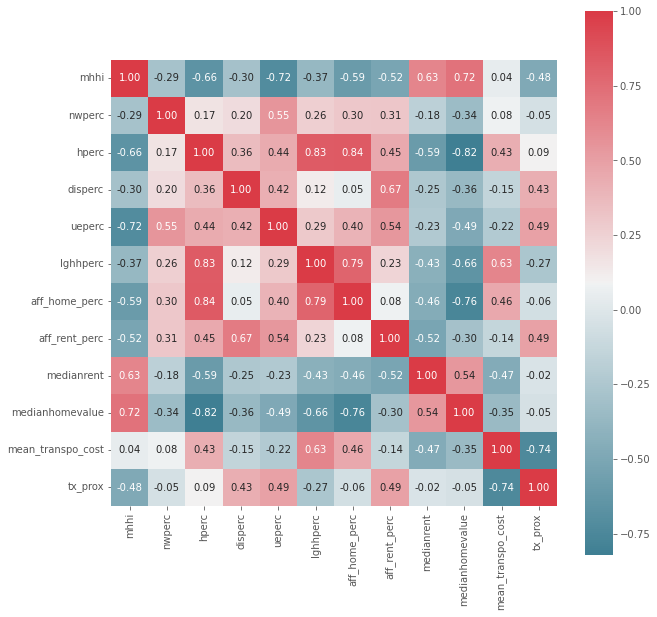

In [158]:
# Select specific columns to use in the correlation heatmap
columns = ['mhhi', 'nwperc', 'hperc', 'disperc', 'ueperc', 'lghhperc', 'aff_home_perc', 'aff_rent_perc', 'medianrent', 'medianhomevalue', 'mean_transpo_cost', 'tx_prox']

# Compute correlation matrix
corr = df[columns].corr()

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(10, 10))

# Generate a custom colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create the heatmap
sns.heatmap(corr, cmap=cmap, annot=True, fmt='.2f', square=True, ax=ax)
# --------------------------------------------

# Rent/Home Values are strongly correlated to Median Household Income
# Larger Households (5+) have strong correlations to Home Affordability Percentage
# Zip Codes/Areas with high non-white and hispanic populations have strong negative correlations to high Median Household Incomes, Home Values, and Rents
# Low-Income Housing Areas (aff_home_perc, to a lesser degree aff_rent_perc) has a strong inverse correlation to Median Home Value
# The further the distance from Public Transportation, the lower the Mean Transportation Cost
# Proximity to Transportation is moderately correlated with areas that have noticeable disabled and hispanic populations 

### 7b. Zip Codes Where The Most Crime Occurs

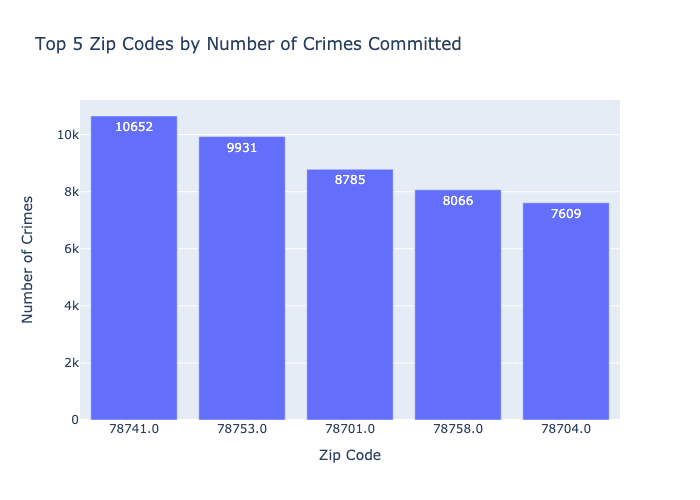

In [130]:
# Group the rows by zip code and count the number of rows in each group
zip_counts = df.groupby('zip').size().reset_index(name='count')

# Sort the zip codes by count in descending order and take the top 5
top_zip_counts = zip_counts.sort_values(by='count', ascending=False).head(5)

# Create a bar chart using Plotly
fig = go.Figure([go.Bar(x=top_zip_counts['zip'], y=top_zip_counts['count'], text=top_zip_counts['count'], textposition='auto')])
fig.update_layout(title='Top 5 Zip Codes by Number of Crimes Committed', xaxis_title='Zip Code', yaxis_title='Number of Crimes')
fig.show()

# Save the figure as a PNG file
#fig.write_image('top5_zip_crime.png', engine='kaleido')

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

# ----------------------------------------------------

# 1. 78741: 10652
# 2. 78753: 9932
# 3. 78701: 8785
# 4. 78758: 8066
# 5. 78704: 7609

### 7c. Most Frequent Crimes Committed

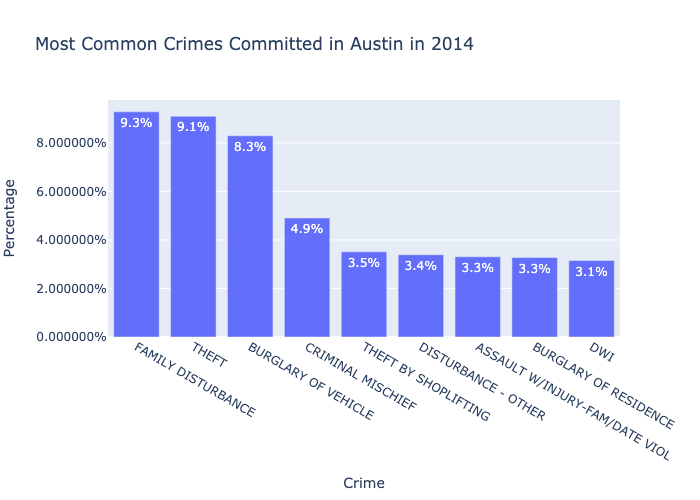

In [131]:
# Calculate the percentage of each value count
value_counts = df['offdec'].value_counts(normalize=True) * 100

# Filter the values to only include those that meet the threshold of 3% of total rows
filtered_counts = value_counts[value_counts > 3]

filtered_counts = filtered_counts / 100

# Create a bar chart that displays the percentage of each value count
fig = px.bar(filtered_counts, x=filtered_counts.index, y=filtered_counts.values, 
             labels={'x': 'Crime', 'y': 'Percentage'},
             title='Most Common Crimes Committed in Austin in 2014')
fig.update_traces(texttemplate='%{y:.1f}%', textposition='inside')
fig.update_layout(yaxis_tickformat = '%',xaxis_title='Crime', yaxis_title='Percentage')

fig.update_traces(texttemplate='%{y:.1%}', textposition='inside')
# Set the y-axis tick format to display percentages
# fig.update_yaxes(tickformat=".01%")

# fig.write_image('crimes_austin.png', engine='kaleido')


# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)



#------------------------------------------------------------

# 1. Family Disturbance, Theft, Burglary of Vehicle --> Crimes of DV/Violence - made up ~30% of crime
        # See which zip codes that these crimes are most often occurring --> Tableau

### 7d. Most Frequent Locations Where Crimes Took Place

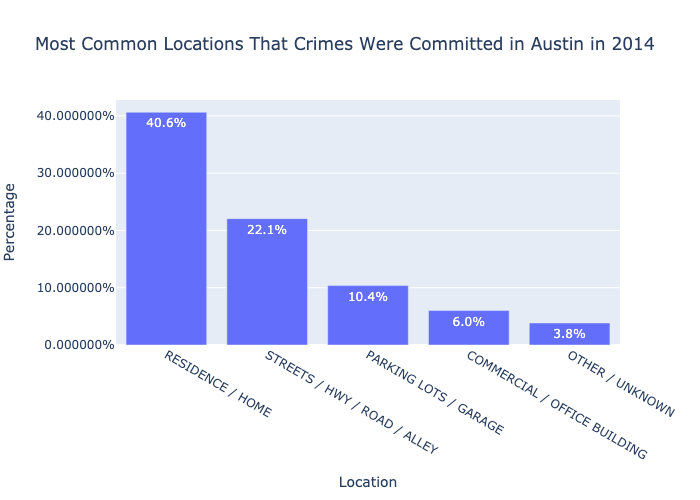

In [132]:
value_counts = df['loctype'].value_counts(normalize=True) * 100

# Filter the values to only include those that meet the threshold of 3% of total rows
filtered_counts = value_counts[value_counts > 3]

filtered_counts = filtered_counts / 100

# Create a bar chart that displays the percentage of each value count
fig = px.bar(filtered_counts, x=filtered_counts.index, y=filtered_counts.values, 
             labels={'x': 'Values', 'y': 'Percentage'},
             title='Most Common Locations That Crimes Were Committed in Austin in 2014')
fig.update_traces(texttemplate='%{y:.1f}%', textposition='inside')
fig.update_layout(yaxis_tickformat = '%', xaxis_title='Location', yaxis_title='Percentage')


fig.update_traces(texttemplate='%{y:.1%}', textposition='inside')
# Set the y-axis tick format to display percentages
# fig.update_yaxes(tickformat=".01%")

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

#--------------------------------------------------------------------------------------------
# Residence/Home crimes made up the majority of crimes
# Domicile, and (likely) vehicle-based/related crimes made up 70% of crimes committed

### 7d. Median Household Income - Box Plot

In [138]:
df['mhhi'].mean()

48712.27357104585

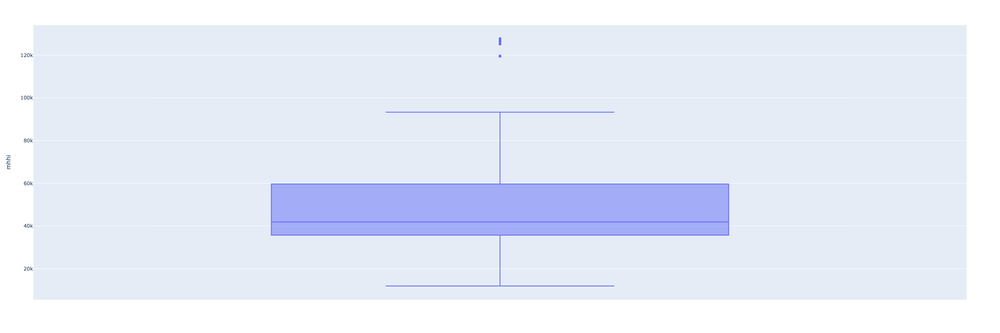

In [133]:
# 5-Number Summary

# Max: 127.726k
# Q3: 59.685k
# Median: 41.869k
# Q1: 35.711k
# Min: 11.917k


# Median MHHI = 41.7k, Mean = 48.7k


#--------> COMPARE TO RECENT DATA

# -----------------------

mhhi = df['mhhi']
fig = px.box(df, y="mhhi", width=2400, height=800)
fig.show()

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

#### 7e. Which Zip Codes for Min/Max?

In [101]:
# Max Zip Code: 78732


# Find the row with the maximum median rent value
max_row = df.loc[df['mhhi'].idxmax()]

# Get the zip code for the maximum median rent value
max_zip = max_row['zip']

max_zip

'78732.0'

In [104]:
# Max Zip Code: 78705


# Find the row with the maximum median rent value
min_row = df.loc[df['mhhi'].idxmin()]

# Get the zip code for the maximum median rent value
min_zip = min_row['zip']

min_zip

'78705.0'

### 7f. Median Household Income - Top 5 Highest by Zip Code

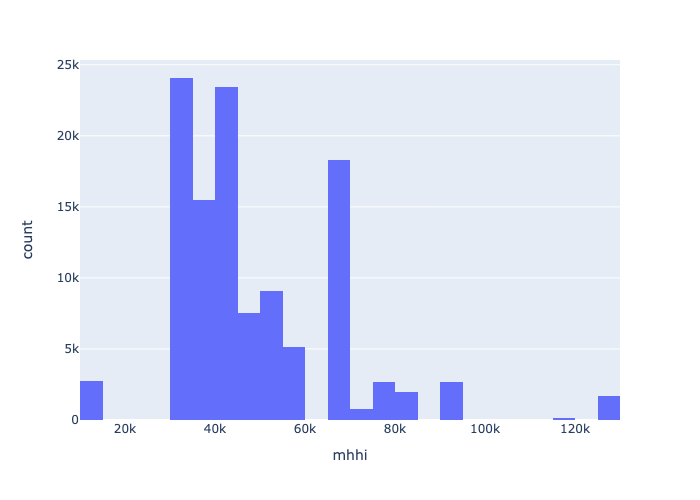

In [134]:
fig = px.histogram(df, x="mhhi", nbins=50)
fig.show()

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

#### 7g. Median Household Income - Outlier Analysis

In [106]:
ct = len(df)
ct

120229

In [144]:
# Count the number of rows where Median Hosuehold Income is above $119,573
count = (df['mhhi'] >= 119573).sum()

print(f"Number of rows where mhhi > 119,572: {count}.")

Number of rows where mhhi > 119,572: 1847.


In [109]:
# mhhi outlier percentage

mhhiop = round((count/ct)*(100.00),2)
print(f"The percentage of rows where mhhi is greater than $119.573 is {mhhiop}%.")

The percentage of rows where mhhi is greater than 119.573 is 1.54%.


### 7g. Median Household Income - Top 5 Highest by Zip Code

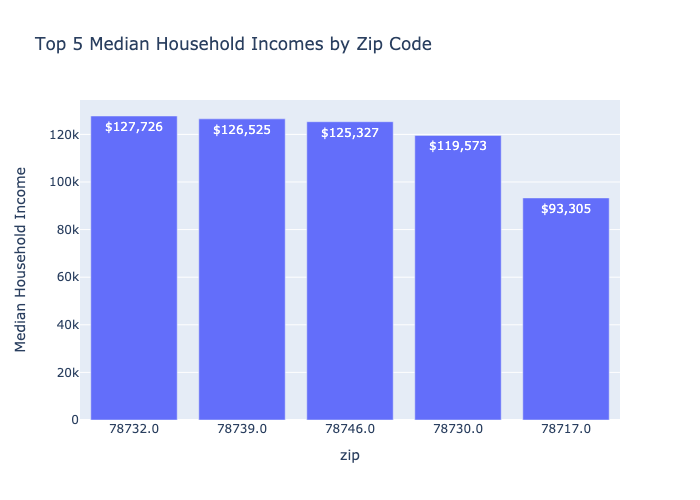

In [135]:
# Top - 5 Zip Codes

# 1. 78732 - $127,726
# 2. 78739 - $126,525
# 3. 78746 - $125,327
# 4. 78730 - $119,573
# 5. 78717 - $93,305



#-----------------------------------------------------------------------------------------

# Group the data by zip code and select the median household income
grouped_data = df.groupby('zip')['mhhi'].max().reset_index()

# Sort the data by median household income and select the top 5 zip codes
top_5 = grouped_data.sort_values('mhhi', ascending=False).head(5)

# Define a function to format the 'mhhi' values as desired
def format_mhhi(mhhi):
    return '${:,.0f}'.format(mhhi)

# Apply the format_mhhi function to the 'mhhi' column
top_5['mhhi_text'] = top_5['mhhi'].apply(format_mhhi)

# Plot the bar chart using plotly
fig = px.bar(top_5, x='zip', y='mhhi', text='mhhi_text',
             title='Top 5 Median Household Incomes by Zip Code', )
fig.update_traces(textposition='inside')
fig.update_yaxes(title='Median Household Income')
fig.show()

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

### 7h. Median Rent - Box Plot

In [137]:
df['medianrent'].mean()

973.2292289610591

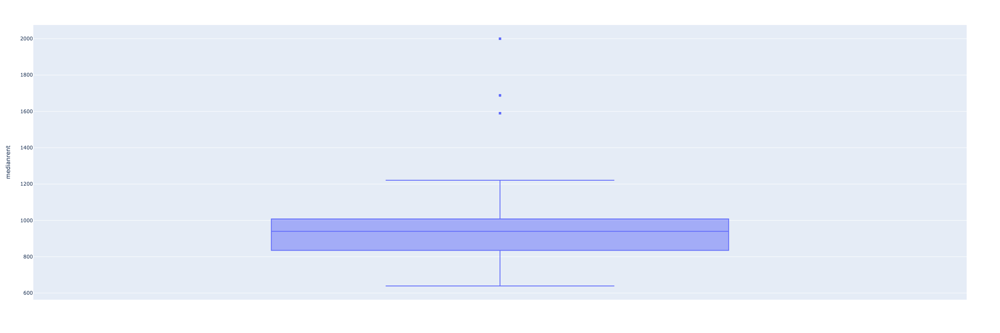

In [136]:
# 5-Number Summary

# Max: $2000
# Q3: $1008
# Median: $940
# Q1: $835
# Min: $ 639


# Mean: 973, Median: 940. Identical


####--------> COMPARE TO RECENT DATA

# -----------------------

mr = df['medianrent']
fig = px.box(df, y="medianrent", width=2400, height=800)
fig.show()

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

#### 7i. Which Zip Codes for Min/Max?

In [139]:
# Max Zip Code: 78739


# Find the row with the maximum median rent value
max_row = df.loc[df['medianrent'].idxmax()]

# Get the zip code for the maximum median rent value
max_zip = max_row['zip']

max_zip

'78739.0'

In [140]:
# Min Zip: 78742

# Find the row with the maximum median rent value
min_row = df.loc[df['medianrent'].idxmin()]

# Get the zip code for the maximum median rent value
min_zip = min_row['zip']

min_zip

'78742.0'

### 7j. Median Rent - Distribution

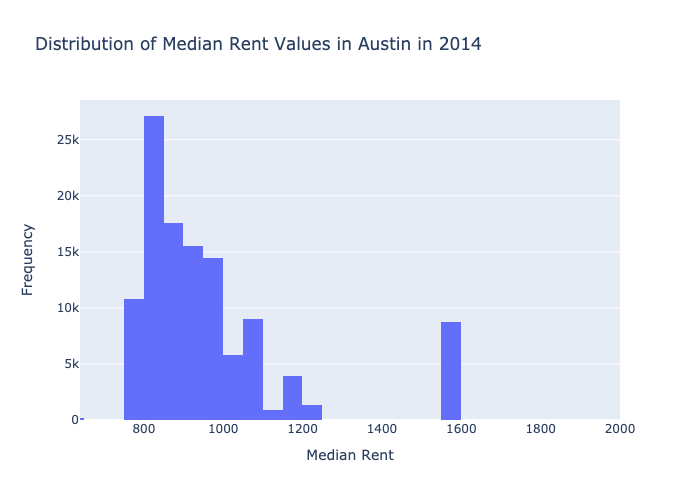

In [146]:
# Plot the histogram using plotly
fig = px.histogram(df, x='medianrent', range_x=[df['medianrent'].min(), df['medianrent'].max()],
                   nbins=50, title='Distribution of Median Rent Values in Austin in 2014')
fig.update_xaxes(title='Median Rent')
fig.update_yaxes(title='Frequency')
fig.show()

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

#### 7k. Median Rent - Outlier Analysis

In [143]:
# Count the number of rows where Median Rent is above $1,221

count = (df['medianrent'] >= 1221).sum()

print(f"Number of rows where Median Rent > $1,221: {count}.")

Number of rows where Median Rent > $1,221: 10487.


In [145]:
# Median Rent Outlier Percentage

mrop = round((count/ct)*(100.00),2)
print(f"The percentage of rows where mhhi is greater than $1,221 is {mrop}%.")

The percentage of rows where mhhi is greater than $1,221 is 1.54%.


### 7l. Median Rent - Top 5 Highest by Zip Code

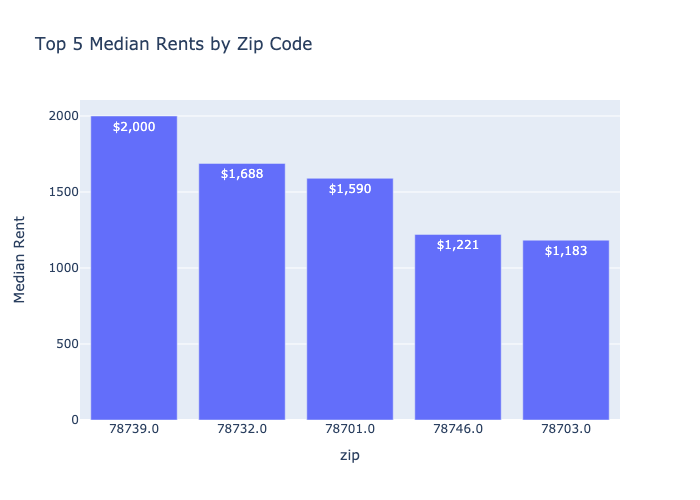

In [148]:
#1. 78739 - $2,000
#2. 78732 - $1,688
#3. 78701 - $1,590
#4. 78746 - $1,221
#5. 78703 - $1,183


# Group the data by zip code and select the median rent
grouped_data = df.groupby('zip')['medianrent'].max().reset_index()

# Sort the data by median rent and select the top 5 zip codes
top_5 = grouped_data.sort_values('medianrent', ascending=False).head(5)

# Define a function to format the 'medianrent' values as desired
def format_mr(mr):
    if mr == 1650:
        return '$1,650'
    else:
        return '${:,.0f}'.format(mr)

# Apply the format_mr function to the 'medianrent' column
top_5['mr_text'] = top_5['medianrent'].apply(format_mr)

# Plot the bar chart using plotly
fig = px.bar(top_5, x='zip', y='medianrent', text='mr_text',
             title='Top 5 Median Rents by Zip Code', )
fig.update_traces(textposition='inside')
fig.update_yaxes(title='Median Rent')
fig.show()

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

### 7m. Median Home Value - Box Plot

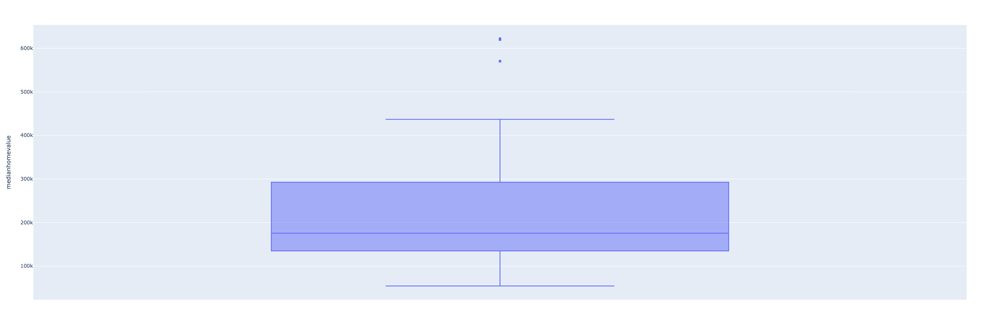

In [153]:
# 5-number Summary

# Max: 621.9k
# Q3: 292.5k
# Median: 175.4k
# Q1: 134.9k
# Min: 54.4k


mhhi = df['medianhomevalue']
fig = px.box(df, y="medianhomevalue", width=2400, height=800)
fig.show()

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

#### 7n. Which Zip Codes for Min/Max?

In [150]:
# Max Zip Code: 78703


# Find the row with the maximum median home value
max_row = df.loc[df['medianhomevalue'].idxmax()]

# Get the zip code for the maximum median home value value
max_zip = max_row['zip']

max_zip

'78703.0'

In [151]:
# Min Zip Code: 78742


# Find the row with the maximum median home value
min_row = df.loc[df['medianhomevalue'].idxmin()]

# Get the zip code for the maximum median home value
min_zip = min_row['zip']

min_zip

'78742.0'

### 7o. Median Home Value - Distribution

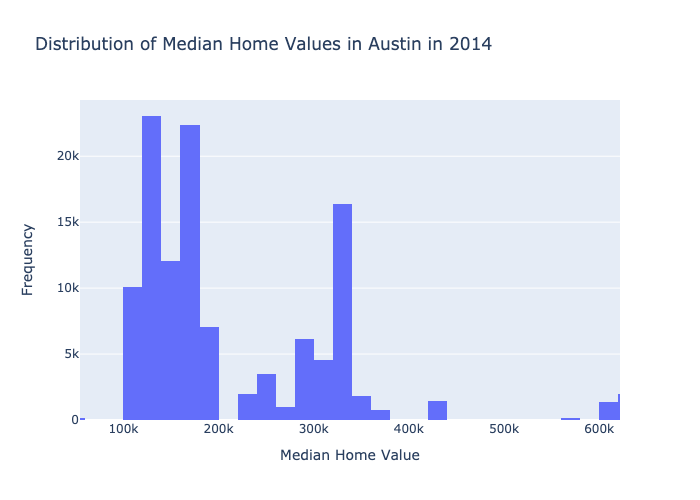

In [154]:
# Plot the histogram using plotly
fig = px.histogram(df, x='medianhomevalue', range_x=[df['medianhomevalue'].min(), df['medianhomevalue'].max()],
                   nbins=50, title='Distribution of Median Home Values in Austin in 2014')
fig.update_xaxes(title='Median Home Value')
fig.update_yaxes(title='Frequency')
fig.show()

# Render the graph as a static image
image_bytes = pio.to_image(fig, format='png')

# Display the image in the notebook
display.Image(image_bytes)

### 7p. Median Home Value - Outlier Analysis

In [156]:
# Count the number of rows where Median Home Value is above 119,573
count = (df['medianhomevalue'] > 436800).sum()

print(f"Number of rows where Median Home Value > $436,800: {count}.")

Number of rows where Median Home Value > $436,800: 3491.
